In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm import tqdm
from glob import glob

In [2]:
# check that names match
bee_size = pd.read_csv('../slides/WWBEE24_IndivBeeWts_ACCESSTEMP.csv')
bee_size['id'] = bee_size['Hive'].map(lambda x: str(x).zfill(2)) + '_' + bee_size['BeeID'].map(str)
bee_size.sort_values('id')

,Hive,BeeID,Weight,id
1947,1,1,0.2487,01_1
1916,1,103,0.1549,01_103
1950,1,105,0.2627,01_105
1918,1,107,0.2490,01_107
1953,1,112,0.2677,01_112
...,...,...,...,...
1712,40,ww48,0.2548,40_ww48
1713,40,ww57,0.3309,40_ww57
1714,40,ww73,0.3336,40_ww73
1715,40,ww74,0.3229,40_ww74


../slides/1_slides/Hive01_Sheet_01_slide12.png 0 01_12
../slides/1_slides/Hive01_Sheet_02_slide121-x.png 0 01_121-x
../slides/1_slides/Hive01_Sheet_03_slideww21-x.png 0 01_ww21-x
../slides/1_slides/Hive05_Sheet_01_slide67.png 0 05_67
../slides/1_slides/Hive05_Sheet_01_slidewv15.png 0 05_wv15
../slides/1_slides/Hive06_Sheet_02_slide43.png 0 06_43
../slides/1_slides/Hive06_Sheet_02_slide59.png 0 06_59
../slides/1_slides/Hive06_Sheet_04_slide127-x.png 0 06_127-x
../slides/1_slides/Hive06_Sheet_04_slide129-x.png 0 06_129-x
../slides/1_slides/Hive06_Sheet_04_slide135-x.png 0 06_135-x
../slides/1_slides/Hive06_Sheet_05_slide127-x.png 0 06_127-x
../slides/1_slides/Hive06_Sheet_05_slide129-x.png 0 06_129-x
../slides/1_slides/Hive06_Sheet_05_slide135-x.png 0 06_135-x
../slides/1_slides/Hive07_Sheet_04_slide118-x.png 0 07_118-x
../slides/1_slides/Hive07_Sheet_04_slide119-x.png 0 07_119-x
../slides/1_slides/Hive07_Sheet_05_slide119-x.png 0 07_119-x
../slides/1_slides/Hive07_Sheet_06_slide118-x.pn

/tmp/ipykernel_8038/2664729696.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


../slides/1_slides/Hive08_Sheet_03_slide105.png 0 08_105
../slides/1_slides/Hive08_Sheet_04_slide152.png 0 08_152
../slides/1_slides/Hive08_Sheet_05_slide160.png 0 08_160
../slides/1_slides/Hive08_Sheet_05_slide161.png 0 08_161
../slides/1_slides/Hive08_Sheet_05_slide162.png 0 08_162
../slides/1_slides/Hive08_Sheet_06_slide115.png 0 08_115
../slides/1_slides/Hive08_Sheet_06_slide14.png 0 08_14
../slides/1_slides/Hive08_Sheet_06_slide61.png 0 08_61
../slides/1_slides/Hive08_Sheet_06_slide62.png 0 08_62
../slides/1_slides/Hive10_Sheet_04_slide-117.png 0 10_-117
../slides/1_slides/Hive12_Sheet_01_slideww05.png 0 12_ww05
../slides/1_slides/Hive12_Sheet_01_slideww07.png 0 12_ww07
../slides/1_slides/Hive14_Sheet_01_slideww01.png 0 14_ww01
../slides/1_slides/Hive14_Sheet_01_slideww02.png 0 14_ww02
../slides/1_slides/Hive14_Sheet_01_slideww03.png 0 14_ww03
../slides/1_slides/Hive15_Sheet_02_slideww03.png 0 15_ww03
../slides/1_slides/Hive15_Sheet_02_slideww04.png 0 15_ww04
../slides/1_slides/Hi

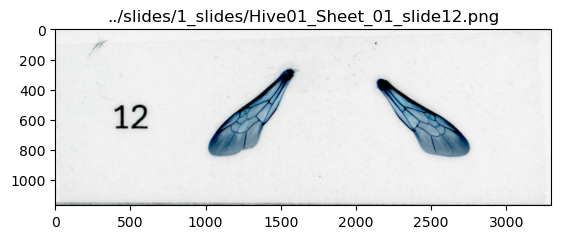

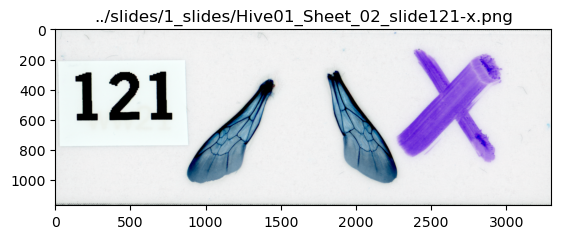

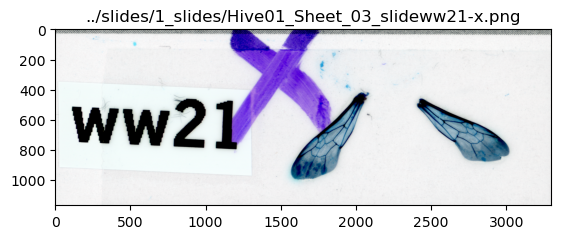

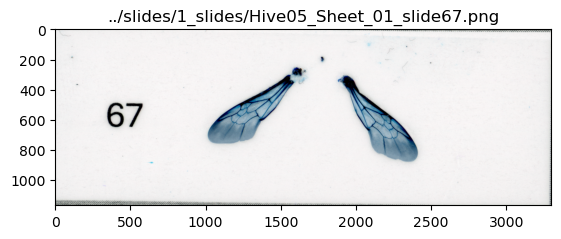

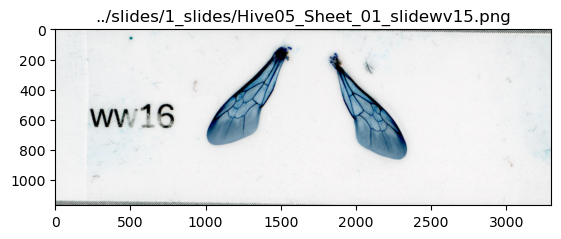

...

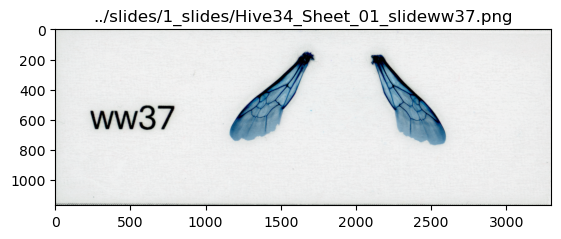

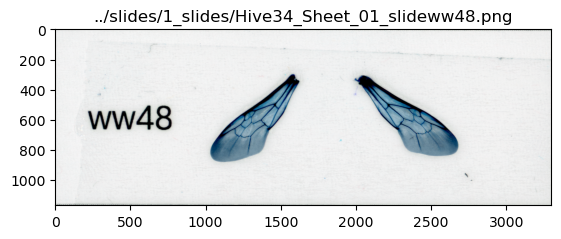

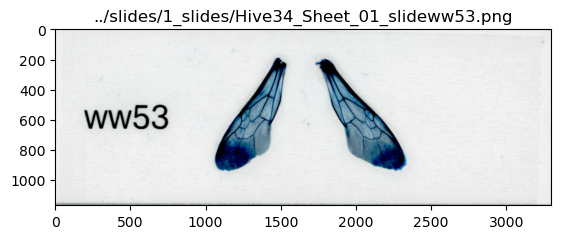

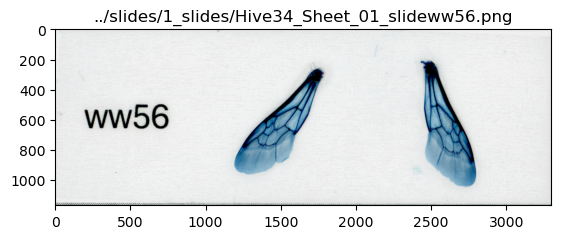

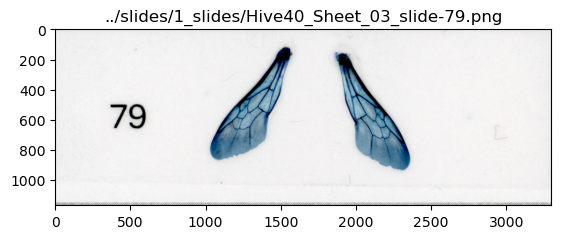

In [11]:
fps = sorted(glob('../slides/1_slides/*'))
fns = [x.split('/')[-1].split('.')[0] for x in fps]
ids = [x.split('_')[0].replace('Hive','') + '_' + x.split('slide')[-1] for x in fns]

# check if every image in the weight
for fp in fps:
    fn = fp.split('/')[-1].split('.')[0]
    _id = fn.split('_')[0].replace('Hive','') + '_' + fn.split('slide')[-1]
    if len(bee_size[bee_size['id'] == _id]) != 1:
        if 'C' not in _id:
            print(fp, len(bee_size[bee_size['id'] == _id]), _id)
            plt.figure()
            plt.imshow(cv2.imread(fp))
            plt.title(fp)

In [11]:
mask_fps = glob('../slides/2_masks/*')
for fp in mask_fps:
    if 'slidew' in fp.lower():
        print(fp)

../slides/2_masks/Hive14_Sheet_02_slideww3O_left.jpg
../slides/2_masks/Hive14_Sheet_01_slideww03_left.jpg
../slides/2_masks/Hive01_Sheet_02_slideww30_left.jpg
../slides/2_masks/Hive15_Sheet_02_slideWWO5_left.jpg
../slides/2_masks/Hive02_Sheet_03_slideWW41_right.jpg
../slides/2_masks/Hive13_Sheet_02_slidewW22_right.jpg
../slides/2_masks/Hive25_Sheet_01_slideww32_left.jpg
../slides/2_masks/Hive25_Sheet_01_slideWW12_right.jpg
../slides/2_masks/Hive02_Sheet_03_slideWW62_right.jpg
../slides/2_masks/Hive13_Sheet_02_slideww19_left.jpg
../slides/2_masks/Hive40_Sheet_04_slideww74_right.jpg
../slides/2_masks/Hive04_Sheet_02_slideWW41_left.jpg
../slides/2_masks/Hive02_Sheet_03_slideww14_left.jpg
../slides/2_masks/Hive11_Sheet_01_slideww13_right.jpg
../slides/2_masks/Hive14_Sheet_02_slideww28_right.jpg
../slides/2_masks/Hive02_Sheet_03_slideww1O_right.jpg
../slides/2_masks/Hive23_Sheet_01_slideww21_right.jpg
../slides/2_masks/Hive24_Sheet_01_slideww18_right.jpg
../slides/2_masks/Hive04_Sheet_02_sl

In [82]:
out = []
for fp in tqdm(mask_fps):
    mask = cv2.imread(fp, cv2.IMREAD_GRAYSCALE)
    
    big_cell_fp = fp.replace('2_masks','4_cleaned_sam_masks_big_cell')
    medial_fp = fp.replace('2_masks','3_sam_masks_medial')

    try:
        big_cell_mask = cv2.imread(big_cell_fp, cv2.IMREAD_GRAYSCALE)
        medial_mask = cv2.imread(medial_fp, cv2.IMREAD_GRAYSCALE)
        big_cell_size = len(np.where(big_cell_mask > 100)[0])
        medial_size = len(np.where(medial_mask > 100)[0])
        
        out += [[fp, len(np.where(mask> 10)[0]), big_cell_size, medial_size]]
    except:
        print('wtf')
        pass

 39%|███████████████████████████████████████████████████████████████▍                                                                                                   | 1563/4020 [00:05<00:09, 272.97it/s]

wtf


 55%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                         | 2213/4020 [00:08<00:06, 292.65it/s]

wtf


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4020/4020 [00:14<00:00, 273.30it/s]


In [80]:
big_cell_mask

In [62]:
big_cell_fp

'../slides/2_masks/Hive29_Sheet_04_slide115_right.png'

In [118]:
df = pd.DataFrame(out, columns=['fp','n_pixels', 'n_big_cell_pixels','n_medial_pixels'])
df['fn'] = df['fp'].map(lambda x: x.split('/')[-1])
df['slide'] = df['fn'].map(lambda x: '_'.join(x.split('_')[:-1]))
df['wing'] = df['fn'].map(lambda x: x.split('_')[-1].split('.')[0])
df['has_age?'] = df['fn'].map(lambda x: 'slidew' in x.lower())
df = df.sort_values(['slide','wing'])
af = df[df['has_age?']]
df['Hive'] = df['fn'].map(lambda x: x.split('_')[0][-2:])
df['BeeID'] = df['fn'].map(lambda x: x.split('_')[3].replace('slide',''))
df['id'] = df['Hive'] + '_' + df['BeeID'].map(lambda x: str(x).lower())
df.sort_values('id')

,fp,n_pixels,n_big_cell_pixels,n_medial_pixels,fn,slide,wing,has_age?,Hive,BeeID,id
102,../slides/2_masks/Hive01_Sheet_01_slide'_left.jpg,147557,27097,11498,Hive01_Sheet_01_slide'_left.jpg,Hive01_Sheet_01_slide',left,False,01,',01_'
11,../slides/2_masks/Hive01_Sheet_01_slide'_right...,153717,59655,8064,Hive01_Sheet_01_slide'_right.jpg,Hive01_Sheet_01_slide',right,False,01,',01_'
1493,../slides/2_masks/Hive01_Sheet_01_slide1_left.jpg,122515,47044,6517,Hive01_Sheet_01_slide1_left.jpg,Hive01_Sheet_01_slide1,left,False,01,1,01_1
2985,../slides/2_masks/Hive01_Sheet_01_slide1_right...,127076,48235,6959,Hive01_Sheet_01_slide1_right.jpg,Hive01_Sheet_01_slide1,right,False,01,1,01_1
1458,../slides/2_masks/Hive01_Sheet_02_slide103_rig...,105838,41928,5633,Hive01_Sheet_02_slide103_right.jpg,Hive01_Sheet_02_slide103,right,False,01,103,01_103
...,...,...,...,...,...,...,...,...,...,...,...
1056,../slides/2_masks/HiveC5_Sheet_03_slide72_left...,134665,48805,7023,HiveC5_Sheet_03_slide72_left.jpg,HiveC5_Sheet_03_slide72,left,False,C5,72,C5_72
1805,../slides/2_masks/HiveC5_Sheet_01_slide8_left.jpg,112204,44434,6041,HiveC5_Sheet_01_slide8_left.jpg,HiveC5_Sheet_01_slide8,left,False,C5,8,C5_8
1500,../slides/2_masks/HiveC5_Sheet_01_slide8_right...,116287,45100,6133,HiveC5_Sheet_01_slide8_right.jpg,HiveC5_Sheet_01_slide8,right,False,C5,8,C5_8
3180,../slides/2_masks/HiveC5_Sheet_01_slide9_right...,140345,54789,7683,HiveC5_Sheet_01_slide9_right.jpg,HiveC5_Sheet_01_slide9,right,False,C5,9,C5_9


In [96]:
df

,fp,n_pixels,n_big_cell_pixels,n_medial_pixels,fn,slide,wing,has_age?,Hive,BeeID,id
102,../slides/2_masks/Hive01_Sheet_01_slide'_left.jpg,147557,27097,11498,Hive01_Sheet_01_slide'_left.jpg,Hive01_Sheet_01_slide',left,False,01,',01_'
11,../slides/2_masks/Hive01_Sheet_01_slide'_right...,153717,59655,8064,Hive01_Sheet_01_slide'_right.jpg,Hive01_Sheet_01_slide',right,False,01,',01_'
1493,../slides/2_masks/Hive01_Sheet_01_slide1_left.jpg,122515,47044,6517,Hive01_Sheet_01_slide1_left.jpg,Hive01_Sheet_01_slide1,left,False,01,1,01_1
2985,../slides/2_masks/Hive01_Sheet_01_slide1_right...,127076,48235,6959,Hive01_Sheet_01_slide1_right.jpg,Hive01_Sheet_01_slide1,right,False,01,1,01_1
417,../slides/2_masks/Hive01_Sheet_01_slide12_left...,130125,48057,6914,Hive01_Sheet_01_slide12_left.jpg,Hive01_Sheet_01_slide12,left,False,01,12,01_12
...,...,...,...,...,...,...,...,...,...,...,...
3614,../slides/2_masks/HiveC5_Sheet_03_slide70_righ...,96992,36257,5316,HiveC5_Sheet_03_slide70_right.jpg,HiveC5_Sheet_03_slide70,right,False,C5,70,C5_70
1303,../slides/2_masks/HiveC5_Sheet_03_slide71_left...,149978,55410,8652,HiveC5_Sheet_03_slide71_left.jpg,HiveC5_Sheet_03_slide71,left,False,C5,71,C5_71
239,../slides/2_masks/HiveC5_Sheet_03_slide71_righ...,152347,39534,8296,HiveC5_Sheet_03_slide71_right.jpg,HiveC5_Sheet_03_slide71,right,False,C5,71,C5_71
1056,../slides/2_masks/HiveC5_Sheet_03_slide72_left...,134665,48805,7023,HiveC5_Sheet_03_slide72_left.jpg,HiveC5_Sheet_03_slide72,left,False,C5,72,C5_72


In [127]:
bf = pd.DataFrame(index=df['slide'].drop_duplicates())
bf['left_size'] = df[df['wing']=='left'].set_index('slide')['n_pixels']
bf['right_size'] = df[df['wing']=='right'].set_index('slide')['n_pixels']
bf['left_bc_size'] = df[df['wing']=='left'].set_index('slide')['n_big_cell_pixels']
bf['right_bc_size'] = df[df['wing']=='right'].set_index('slide')['n_big_cell_pixels']
bf['left_m_size'] = df[df['wing']=='left'].set_index('slide')['n_medial_pixels']
bf['right_m_size'] = df[df['wing']=='right'].set_index('slide')['n_medial_pixels']
bf.sort_index()

,left_size,right_size,left_bc_size,right_bc_size,left_m_size,right_m_size
slide,,,,,,
Hive01_Sheet_01_slide',147557,153717.0,27097,59655.0,11498,8064.0
Hive01_Sheet_01_slide1,122515,127076.0,47044,48235.0,6517,6959.0
Hive01_Sheet_01_slide12,130125,128351.0,48057,48454.0,6914,6818.0
Hive01_Sheet_01_slide17,132833,134023.0,51388,50792.0,7065,6964.0
Hive01_Sheet_01_slide32,135295,138336.0,49636,51255.0,7246,7436.0
...,...,...,...,...,...,...
HiveC5_Sheet_03_slide68,146751,152238.0,56656,57341.0,8256,8296.0
HiveC5_Sheet_03_slide69,135613,136161.0,49925,51682.0,7166,7306.0
HiveC5_Sheet_03_slide70,96642,96992.0,36147,36257.0,5291,5316.0


In [138]:
bf

,left_size,right_size,left_bc_size,right_bc_size,left_m_size,right_m_size
slide,,,,,,
Hive01_Sheet_01_slide',147557,153717.0,27097,59655.0,11498,8064.0
Hive01_Sheet_01_slide1,122515,127076.0,47044,48235.0,6517,6959.0
Hive01_Sheet_01_slide12,130125,128351.0,48057,48454.0,6914,6818.0
Hive01_Sheet_01_slide17,132833,134023.0,51388,50792.0,7065,6964.0
Hive01_Sheet_01_slide32,135295,138336.0,49636,51255.0,7246,7436.0
...,...,...,...,...,...,...
HiveC5_Sheet_03_slide68,146751,152238.0,56656,57341.0,8256,8296.0
HiveC5_Sheet_03_slide69,135613,136161.0,49925,51682.0,7166,7306.0
HiveC5_Sheet_03_slide70,96642,96992.0,36147,36257.0,5291,5316.0


In [128]:
af[af['wing']=='left'].set_index('slide')['n_pixels'].sort_index()

slide
Hive01_Sheet_02_slideWW13    113131
Hive01_Sheet_02_slideWW16     87538
Hive01_Sheet_02_slideWW26     94331
Hive01_Sheet_02_slideWW4      93954
Hive01_Sheet_02_slideWW41    104247
                              ...  
Hive40_Sheet_04_slidewW4O    184709
Hive40_Sheet_04_slidewW57    162330
Hive40_Sheet_04_slideww73    172445
Hive40_Sheet_04_slideww74    177916
Hive40_Sheet_04_slideww76    116766
Name: n_pixels, Length: 158, dtype: int64

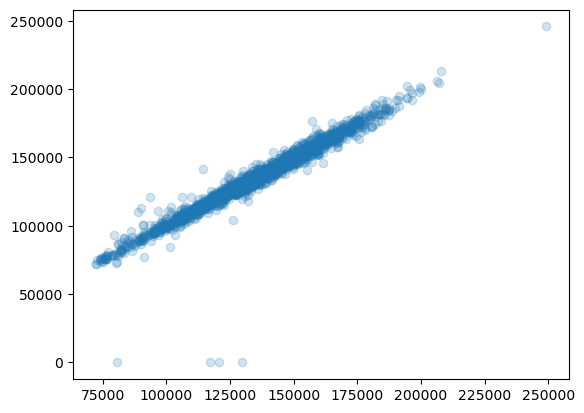

In [139]:
plt.scatter(bf['left_size'], bf['right_size'], alpha=0.2)
plt.savefig('../for_presentation/wing_size_plot.png')

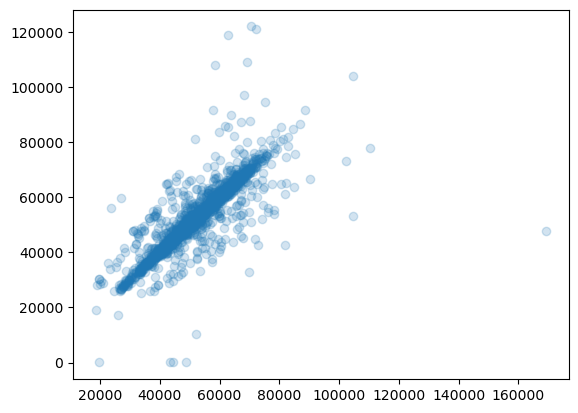

In [136]:
plt.scatter(bf['left_bc_size'], bf['right_bc_size'], alpha=0.2)
plt.savefig('../for_presentation/big_cell_size_plot.png')

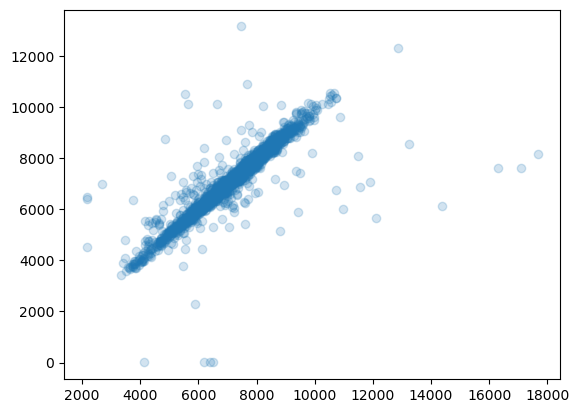

In [137]:
bf = bf[bf['right_m_size'] < 20000]
plt.scatter(bf['left_m_size'], bf['right_m_size'], alpha=0.2)
plt.savefig('../for_presentation/medial_size_plot.png')

In [ ]:
plt.scatter(bf['left_'], bf['right'])
plt.savefig('../for_presentation/wing_size_plot.png')

In [100]:
bee_size = pd.read_csv('../slides/WWBEE24_IndivBeeWts_ACCESSTEMP.csv')
bee_size['id'] = bee_size['Hive'].map(lambda x: str(x).zfill(2)) + '_' + bee_size['BeeID'].map(str)
bee_size.sort_values('id')

,Hive,BeeID,Weight,id
1947,1,1,0.2487,01_1
1916,1,103,0.1549,01_103
1950,1,105,0.2627,01_105
1918,1,107,0.2490,01_107
1953,1,112,0.2677,01_112
...,...,...,...,...
1712,40,ww48,0.2548,40_ww48
1713,40,ww57,0.3309,40_ww57
1714,40,ww73,0.3336,40_ww73
1715,40,ww74,0.3229,40_ww74


In [101]:
df['weight'] = df['id'].map(bee_size.set_index('id')['Weight'])
df = df.dropna(subset=['weight'])
df

,fp,n_pixels,n_big_cell_pixels,n_medial_pixels,fn,slide,wing,has_age?,Hive,BeeID,id,weight
1493,../slides/2_masks/Hive01_Sheet_01_slide1_left.jpg,122515,47044,6517,Hive01_Sheet_01_slide1_left.jpg,Hive01_Sheet_01_slide1,left,False,01,1,01_1,0.2487
2985,../slides/2_masks/Hive01_Sheet_01_slide1_right...,127076,48235,6959,Hive01_Sheet_01_slide1_right.jpg,Hive01_Sheet_01_slide1,right,False,01,1,01_1,0.2487
3605,../slides/2_masks/Hive01_Sheet_01_slide17_left...,132833,51388,7065,Hive01_Sheet_01_slide17_left.jpg,Hive01_Sheet_01_slide17,left,False,01,17,01_17,0.2697
1937,../slides/2_masks/Hive01_Sheet_01_slide17_righ...,134023,50792,6964,Hive01_Sheet_01_slide17_right.jpg,Hive01_Sheet_01_slide17,right,False,01,17,01_17,0.2697
3258,../slides/2_masks/Hive01_Sheet_01_slide32_left...,135295,49636,7246,Hive01_Sheet_01_slide32_left.jpg,Hive01_Sheet_01_slide32,left,False,01,32,01_32,0.2398
...,...,...,...,...,...,...,...,...,...,...,...,...
3039,../slides/2_masks/Hive40_Sheet_04_slideww73_ri...,173133,69769,8830,Hive40_Sheet_04_slideww73_right.jpg,Hive40_Sheet_04_slideww73,right,True,40,ww73,40_ww73,0.3336
3136,../slides/2_masks/Hive40_Sheet_04_slideww74_le...,177916,72115,8944,Hive40_Sheet_04_slideww74_left.jpg,Hive40_Sheet_04_slideww74,left,True,40,ww74,40_ww74,0.3229
121,../slides/2_masks/Hive40_Sheet_04_slideww74_ri...,182617,73333,9196,Hive40_Sheet_04_slideww74_right.jpg,Hive40_Sheet_04_slideww74,right,True,40,ww74,40_ww74,0.3229
2245,../slides/2_masks/Hive40_Sheet_04_slideww76_le...,116766,44778,5844,Hive40_Sheet_04_slideww76_left.jpg,Hive40_Sheet_04_slideww76,left,True,40,ww76,40_ww76,0.2289


/tmp/ipykernel_6833/3006456700.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')


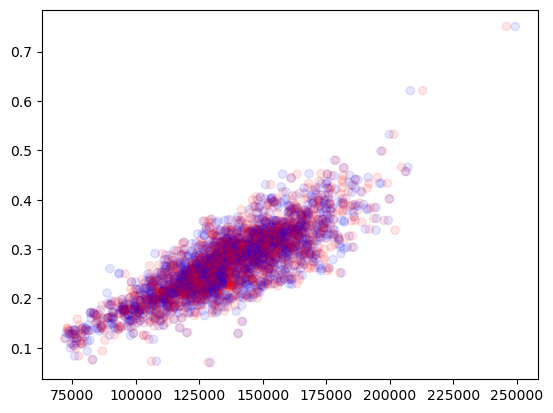

In [102]:
df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')
df = df[df['n_pixels'] > 50000]
plt.scatter(df['n_pixels'], df['weight'], alpha=0.1, c=df['color'])

plt.savefig('../for_presentation/wing_size_vs_weight.png')

In [104]:
df[df['n_pixels']>225000]

,fp,n_pixels,n_big_cell_pixels,n_medial_pixels,fn,slide,wing,has_age?,Hive,BeeID,id,weight,color
3153,../slides/2_masks/Hive37_Sheet_02_slide44_left...,249331,104776,12863,Hive37_Sheet_02_slide44_left.jpg,Hive37_Sheet_02_slide44,left,False,37,44,37_44,0.7509,blue
1641,../slides/2_masks/Hive37_Sheet_02_slide44_righ...,245807,104089,12290,Hive37_Sheet_02_slide44_right.jpg,Hive37_Sheet_02_slide44,right,False,37,44,37_44,0.7509,red


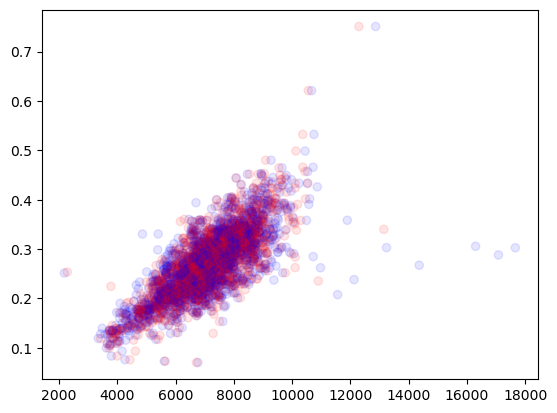

In [112]:
df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')
df = df[df['n_pixels'] > 50000]
df = df[df['n_medial_pixels'] < 30000]
plt.scatter(df['n_medial_pixels'], df['weight'], alpha=0.1, c=df['color'])

plt.savefig('../for_presentation/medial_size_vs_weight.png')

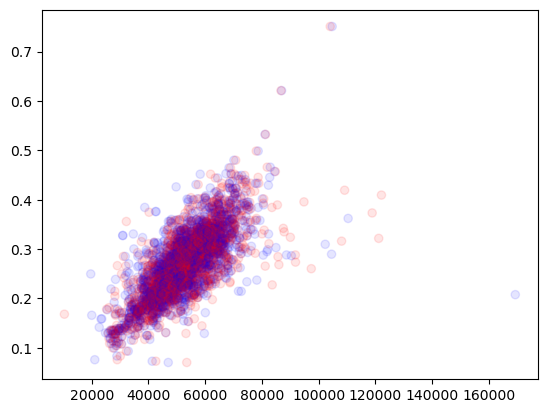

In [113]:
df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')
df = df[df['n_pixels'] > 50000]
df = df[df['n_medial_pixels'] < 30000]
plt.scatter(df['n_big_cell_pixels'], df['weight'], alpha=0.1, c=df['color'])

plt.savefig('../for_presentation/big_cell_size_vs_weight.png')

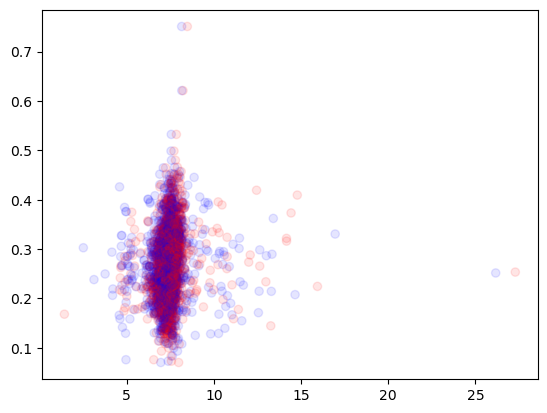

In [114]:
df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')
df = df[df['n_pixels'] > 50000]
df = df[df['n_medial_pixels'] < 30000]
plt.scatter(df['n_big_cell_pixels']/df['n_medial_pixels'], df['weight'], alpha=0.1, c=df['color'])

plt.savefig('../for_presentation/big_cell_ratio_vs_weight.png')

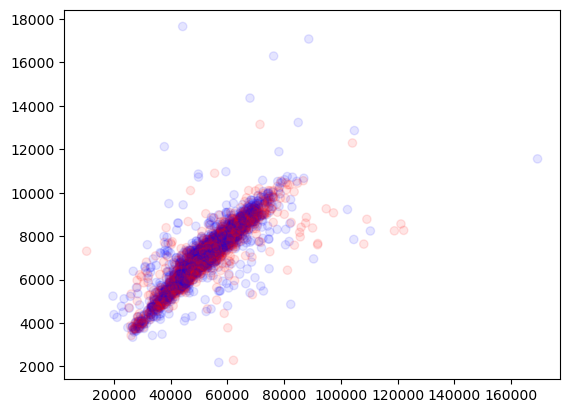

In [115]:
df['color'] = df['wing'].map(lambda x: 'blue' if x == 'left' else 'red')
df = df[df['n_pixels'] > 50000]
df = df[df['n_medial_pixels'] < 30000]
plt.scatter(df['n_big_cell_pixels'],df['n_medial_pixels'], alpha=0.1, c=df['color'])
plt.
plt.savefig('../for_presentation/big_cell_vs_medial.png')